In [ ]:
!pip install torch torchvision
!pip install torch torchvision pillow
!pip install torch torchvision matplotlib
!pip install tqdm


In [2]:
import torch
from torch import nn
from torch.nn import functional as F
from torch.utils.data import DataLoader
from torchvision import transforms
from torch.optim import Adam
from tqdm.notebook import tqdm


In [ ]:
# !gdown --fuzzy https://drive.google.com/file/d/1tM16OAlYUrimMpHsSs7GB1QN6swYuvCx/view?usp=sharing
# !unzip /content/histopathologic-cancer-detection.zip

In [3]:
pcam_directory = '/content'

In [4]:
class CGanGenerator(nn.Module):
    def __init__(self, latent_dimension=100, n_classes=2, output_channels=3):
        super().__init__()
        self.latent_dimension = latent_dimension
        self.n_classes = n_classes
        self.output_channels = output_channels
        self.embedding = nn.Embedding(n_classes, 50)
        self.dense = nn.Linear(50, 6 * 6)
        self.fc1 = nn.Linear(latent_dimension, 1024 * 6 * 6)
        self.conv_blocks = nn.ModuleList([
            self._get_conv_transpose_block(1025, 512),
            self._get_conv_transpose_block(512, 512),
            self._get_conv_transpose_block(512, 512),
            self._get_conv_transpose_block(512, output_channels, last_block=True)
        ])

    def _get_conv_transpose_block(self, in_channels, out_channels, last_block=False):
        layers = [
            nn.ConvTranspose2d(in_channels, out_channels, 5, stride=2, padding=2, output_padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(True)
        ]
        if last_block:
            layers = [nn.ConvTranspose2d(in_channels, out_channels, 5, stride=2, padding=2, output_padding=1),
                      nn.Tanh()]
        return nn.Sequential(*layers)

    def forward(self, noise, labels):
        # Ensure labels are of type torch.long
        labels = labels.long()  # Convert labels to long
        x = self.fc1(noise).view(-1, 1024, 6, 6)
        y = self.dense(self.embedding(labels)).view(-1, 1, 6, 6)
        x = torch.cat([x, y], 1)
        for block in self.conv_blocks:
            x = block(x)
        return x


In [5]:
class CGanDiscriminator(nn.Module):
    def __init__(self, input_shape=(3, 96, 96), n_classes=2):
        super().__init__()
        self.n_classes = n_classes
        self.conv_blocks = nn.ModuleList([
            self._get_conv_block(3, 64, first_block=True),
            self._get_conv_block(64, 128),
            self._get_conv_block(128, 256),
            self._get_conv_block(256, 512),
            self._get_conv_block(512, 512)
        ])
        # Calculate the output size of the last conv layer dynamically
        example_input = torch.rand(1, *input_shape)
        output_size = self.forward_features(example_input).view(-1).shape[0]
        print("Output size for linear layer:", output_size)  # Debug print

        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(output_size, 1),
            nn.Sigmoid()
        )
        self.class_label = nn.Sequential(
            nn.Flatten(),
            nn.Linear(output_size, n_classes),
            nn.Softmax(dim=1)
        )

    def _get_conv_block(self, in_channels, out_channels, first_block=False):
        layers = [
            nn.Conv2d(in_channels, out_channels, 3, stride=2, padding=1),
            nn.LeakyReLU(0.2, True),
            nn.Dropout(0.5)
        ]
        if not first_block:
            layers.insert(1, nn.BatchNorm2d(out_channels))
        return nn.Sequential(*layers)

    def forward_features(self, x):
        for block in self.conv_blocks:
            x = block(x)
        return x

    def forward(self, x):
        x = self.forward_features(x)
        real_fake = self.classifier(x)
        class_label = self.class_label(x)
        return real_fake, class_label


In [6]:
class CGan(nn.Module):
    def __init__(self, generator, discriminator):
        super().__init__()
        self.generator = generator
        self.discriminator = discriminator

    def forward(self, noise, labels):
        self.discriminator.eval()
        gen_imgs = self.generator(noise, labels)
        validity, _ = self.discriminator(gen_imgs)
        return validity



In [7]:
import os
import torch
import numpy as np
from torch.utils.data import Dataset
from torchvision import transforms
from PIL import Image


def get_transforms():
    return transforms.Compose([
        transforms.Resize((96, 96)),  # Assuming images need to be resized
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
    ])

def generate_real_samples(batch, device='cpu'):
    """Prepares a batch of real samples from the DataLoader"""
    images, latent_vectors, labels = batch  # Adjust this line based on your DataLoader output
    images = images.to(device)
    labels = labels.to(device)
    y = torch.ones(images.size(0), 1, dtype=torch.float32).to(device)  # Labels for real samples are all ones
    return images, labels, y

def generate_latent_points(latent_dim, n_samples, n_classes=2, device='cpu'):
    """Generates a batch of latent vectors of random points"""
    z_input = torch.randn(n_samples, latent_dim, device=device)
    labels = torch.randint(0, n_classes, (n_samples,), device=device)
    return z_input, labels

def generate_fake_samples(generator, latent_dim, n_samples, device='cpu'):
    """Generates a batch of fake samples from latent vectors using the generator model."""
    z_input, labels = generate_latent_points(latent_dim, n_samples, device=device)
    with torch.no_grad():
        # Make sure to pass both z_input and labels to the generator
        images = generator(z_input, labels)
    y = torch.zeros(n_samples, 1, dtype=torch.float32).to(device)  # Labels for fake samples are all zeros
    return images, labels, y


In [8]:
import torch
import numpy as np
import matplotlib.pyplot as plt
from math import sqrt
from os.path import join
from dataclasses import dataclass

@dataclass
class TrainParam:
    n_epochs: int
    batch_size: int
    latent_dim: int
    epoch_checkpoint: int
    n_summary_samples: int
    starting_epoch: int = 0
    output_path: str = './'  # Default output path
    model_path: str = './'   # Default model path

def trainer(gan_model, data_loader, train_param, device='cpu'):
    """Train GAN model using given parameters and return the trained model along with training history."""
    gan_model.to(device)
    gan_model.train()
    optimizer_d = torch.optim.Adam(gan_model.discriminator.parameters(), lr=0.0002, betas=(0.5, 0.999))
    optimizer_g = torch.optim.Adam(gan_model.generator.parameters(), lr=0.0004, betas=(0.5, 0.999))

    criterion = torch.nn.BCELoss()
    history = {
        'train_d_loss': [],
        'train_g_loss': []
    }

    for epoch in range(train_param.starting_epoch, train_param.n_epochs):
        train_d_loss, train_g_loss = 0.0, 0.0
        with tqdm(total=len(data_loader), desc=f"Epoch {epoch + 1}/{train_param.n_epochs}", leave=False) as t:
            for batch in data_loader:
                X_real, labels_real, y_real = generate_real_samples(batch, device=device)

                # Training discriminator on real samples
                real_preds, _ = gan_model.discriminator(X_real)
                d_loss_real = criterion(real_preds, y_real)

                # Generate fake samples
                fake_images, labels_fake, y_fake = generate_fake_samples(gan_model.generator, train_param.latent_dim, X_real.size(0), device=device)
                fake_preds, _ = gan_model.discriminator(fake_images.detach())
                d_loss_fake = criterion(fake_preds, y_fake)

                # Update discriminator
                d_loss = d_loss_real + d_loss_fake
                optimizer_d.zero_grad()
                d_loss.backward()
                optimizer_d.step()

                # Update generator
                g_preds, _ = gan_model.discriminator(fake_images)
                g_loss = criterion(g_preds, torch.ones_like(g_preds))

                optimizer_g.zero_grad()
                g_loss.backward()
                optimizer_g.step()

                train_d_loss += d_loss.item()
                train_g_loss += g_loss.item()

                t.set_postfix(D_Loss=f"{d_loss.item():.4f}", G_Loss=f"{g_loss.item():.4f}")
                t.update(1)

        history['train_d_loss'].append(train_d_loss / len(data_loader))
        history['train_g_loss'].append(train_g_loss / len(data_loader))

        if (epoch + 1) % train_param.epoch_checkpoint == 0:
          gan_model.eval()
          z_input, labels = generate_latent_points(train_param.latent_dim, train_param.n_summary_samples, device=device)

          with torch.no_grad():
              fake_images = gan_model.generator(z_input, labels)
          fake_images = ((fake_images * 0.5 + 0.5) * 255).cpu().numpy().astype(np.uint8)

          checkpoint = {
              'epoch': epoch,
              'generator_state_dict': gan_model.generator.state_dict(),
              'discriminator_state_dict': gan_model.discriminator.state_dict(),
              'optimizerG_state_dict': optimizer_g.state_dict(),
              'optimizerD_state_dict': optimizer_d.state_dict(),
          }

          torch.save(checkpoint, f"{train_param.model_path}/GAN_checkpoint_epoch_{epoch+1}.pth")
          plot_images(fake_images, figsize=(15, 15), n_samples=train_param.n_summary_samples, epoch=epoch, output_path=train_param.output_path)
          gan_model.train()

        print(f'Epoch {epoch+1}, Avg D Loss: {train_d_loss / len(data_loader):.4f}, Avg G Loss: {train_g_loss / len(data_loader):.4f}')

    return gan_model, optimizerG, optimizerD, history



def plot_images(X, figsize, n_samples, epoch, output_path=None):
    """Plot and save generated images."""
    sample_sqrt = int(sqrt(n_samples))

    # Create a grid of subplots
    fig, axs = plt.subplots(sample_sqrt, sample_sqrt, figsize=figsize)
    fig.subplots_adjust(right=0.9, left=0.0, top=0.9, bottom=0.0, hspace=0.02, wspace=0.02)

    # Flatten the array of axes if necessary
    axs = np.array(axs).reshape(-1)

    for i in range(n_samples):
        # Plot on the ith subplot
        ax = axs[i]
        ax.axis('off')  # Turn off the axis
        ax.imshow(X[i].transpose(1, 2, 0))  # Transpose as needed depending on data format

    # Save the full figure
    if output_path:
        plt.savefig(join(output_path, f'generated_plot_{epoch}.png'), dpi=300, bbox_inches='tight')

    plt.show()
    plt.close(fig)  # Close the figure to free up memory



In [9]:
import cv2
from torch.utils.data import Dataset, DataLoader
import random


class PCamDataset(Dataset):
    def __init__(self, root_dir, label_mapping, transform=None, latent_dim=100):
        self.root_dir = root_dir
        self.label_mapping = label_mapping
        self.transform = transform
        self.latent_dim = latent_dim
        self.all_fps = [os.path.join(root_dir, fp) for fp in self.label_mapping.keys()]
        print(self.label_mapping, self.all_fps)

    def __getitem__(self, index):
        image_fp = self.all_fps[index]
        slide_id = os.path.basename(image_fp)  # Extracts filename from path
        image = Image.open(image_fp).convert('RGB')
        if self.transform:
            image = self.transform(image)

        label = self.label_mapping[slide_id]

        latent_vector = torch.randn(self.latent_dim)

        return image, latent_vector, label

    def __len__(self):
        return len(self.all_fps)


In [10]:
import csv
label_mapping = {}
with open(os.path.join(pcam_directory, 'train_labels.csv'), 'r') as f:
    reader = csv.reader(f)
    next(reader)  # To skip the header
    label_mapping = {slide_id +'.tif': int(label) for [slide_id, label] in reader}
all_fps = [fp for fp in os.listdir(os.path.join(pcam_directory, 'train'))]
for fp in all_fps: assert fp[-4:] == '.tif', fp[-4:]


In [11]:

train_transforms = transforms.Compose([
    transforms.ColorJitter(),
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])  # Imagenet statistics
])
val_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])  # Imagenet statistics
])
test_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])  # Imagenet statistics
])


In [18]:
permutation = np.random.permutation(len(all_fps))
num_train = int(len(permutation) * 0.6)

train_dataset = PCamDataset(os.path.join(pcam_directory, 'train'), {fp: label_mapping[fp] for fp in all_fps[:num_train] if fp in label_mapping}, transform=train_transforms)
test_dataset = PCamDataset(os.path.join(pcam_directory, 'train'), {fp: label_mapping[fp] for fp in all_fps[num_train:] if fp in label_mapping}, transform=test_transforms)


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [21]:
with open('test_paths.txt', 'w') as file:
            # Write each item from the specified chunk to the file
            for item in all_fps[num_train:]:
                file.write(item + '\n')

In [13]:

train_dataloader = DataLoader(train_dataset, batch_size=128, shuffle=True)
test_dataloader = DataLoader(test_dataset, batch_size=128, shuffle=False)

In [14]:
import torchsummary

In [15]:
latent_dimension = 100  # Dimension of the latent space
n_classes = 2          # Number of classes (for conditional GAN)
output_channels = 3    # Output channels for the generated images (typically 3 for RGB images)
input_shape = (3, 96, 96)  # Input shape for the discriminator (channels, height, width)

train_param = TrainParam(
    n_epochs=2000,
    batch_size=128,
    latent_dim=100,
    epoch_checkpoint=5,
    n_summary_samples=36
)

generator = CGanGenerator(latent_dimension=latent_dimension, n_classes=n_classes, output_channels=output_channels)
discriminator = CGanDiscriminator(input_shape=input_shape, n_classes=n_classes)

# Configure device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Move models to the correct device
generator.to(device)
discriminator.to(device)

# Printing summaries
# The generator expects a latent space vector and class labels as input
# The discriminator expects an image of shape input_shape

print("Generator Summary:")
torchsummary.summary(generator, [(latent_dimension,), (1,)], device=str(device))  # (latent_dimension,) and (1,) for labels

print("\nDiscriminator Summary:")
torchsummary.summary(discriminator, input_shape, device=str(device))
gan = CGan(generator=generator, discriminator=discriminator)


Output size for linear layer: 4608
Generator Summary:
----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Linear-1                [-1, 36864]       3,723,264
         Embedding-2                [-1, 1, 50]             100
            Linear-3                [-1, 1, 36]           1,836
   ConvTranspose2d-4          [-1, 512, 12, 12]      13,120,512
       BatchNorm2d-5          [-1, 512, 12, 12]           1,024
              ReLU-6          [-1, 512, 12, 12]               0
   ConvTranspose2d-7          [-1, 512, 24, 24]       6,554,112
       BatchNorm2d-8          [-1, 512, 24, 24]           1,024
              ReLU-9          [-1, 512, 24, 24]               0
  ConvTranspose2d-10          [-1, 512, 48, 48]       6,554,112
      BatchNorm2d-11          [-1, 512, 48, 48]           1,024
             ReLU-12          [-1, 512, 48, 48]               0
  ConvTranspose2d-13            [-1, 3, 96, 96]  

In [16]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

Epoch 1/2000:   0%|          | 0/1032 [00:00<?, ?it/s]

Epoch 1, Avg D Loss: 0.0200, Avg G Loss: 10.0331


Epoch 2/2000:   0%|          | 0/1032 [00:00<?, ?it/s]

Epoch 2, Avg D Loss: 0.0000, Avg G Loss: 12.5637


Epoch 3/2000:   0%|          | 0/1032 [00:00<?, ?it/s]

Epoch 3, Avg D Loss: 0.0000, Avg G Loss: 13.6118


Epoch 4/2000:   0%|          | 0/1032 [00:00<?, ?it/s]

Epoch 4, Avg D Loss: 0.0000, Avg G Loss: 14.3912


Epoch 5/2000:   0%|          | 0/1032 [00:00<?, ?it/s]

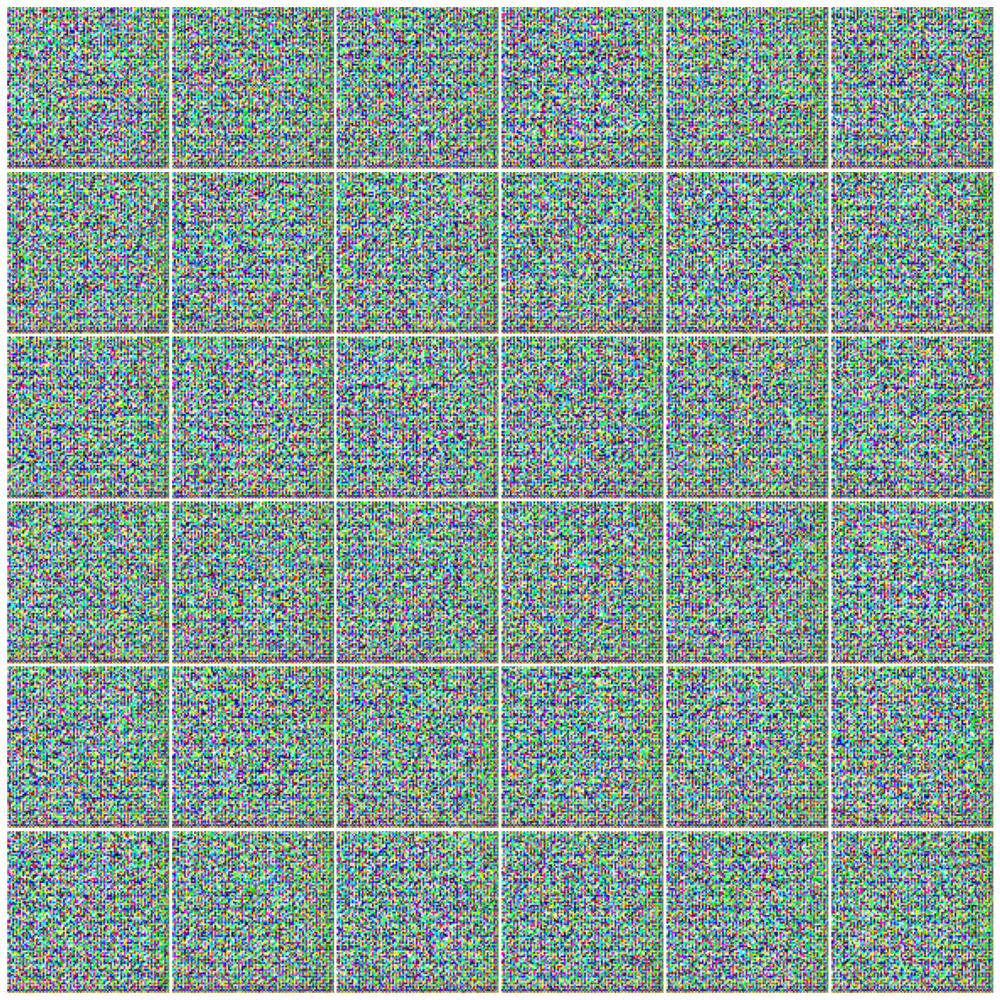

Epoch 5, Avg D Loss: 0.0000, Avg G Loss: 15.0663


Epoch 6/2000:   0%|          | 0/1032 [00:00<?, ?it/s]

Epoch 6, Avg D Loss: 0.0000, Avg G Loss: 15.6793


Epoch 7/2000:   0%|          | 0/1032 [00:00<?, ?it/s]

Epoch 7, Avg D Loss: 0.0000, Avg G Loss: 16.2665


Epoch 8/2000:   0%|          | 0/1032 [00:00<?, ?it/s]

Epoch 8, Avg D Loss: 0.0000, Avg G Loss: 16.8307


Epoch 9/2000:   0%|          | 0/1032 [00:00<?, ?it/s]

Epoch 9, Avg D Loss: 0.0000, Avg G Loss: 17.3825


Epoch 10/2000:   0%|          | 0/1032 [00:00<?, ?it/s]

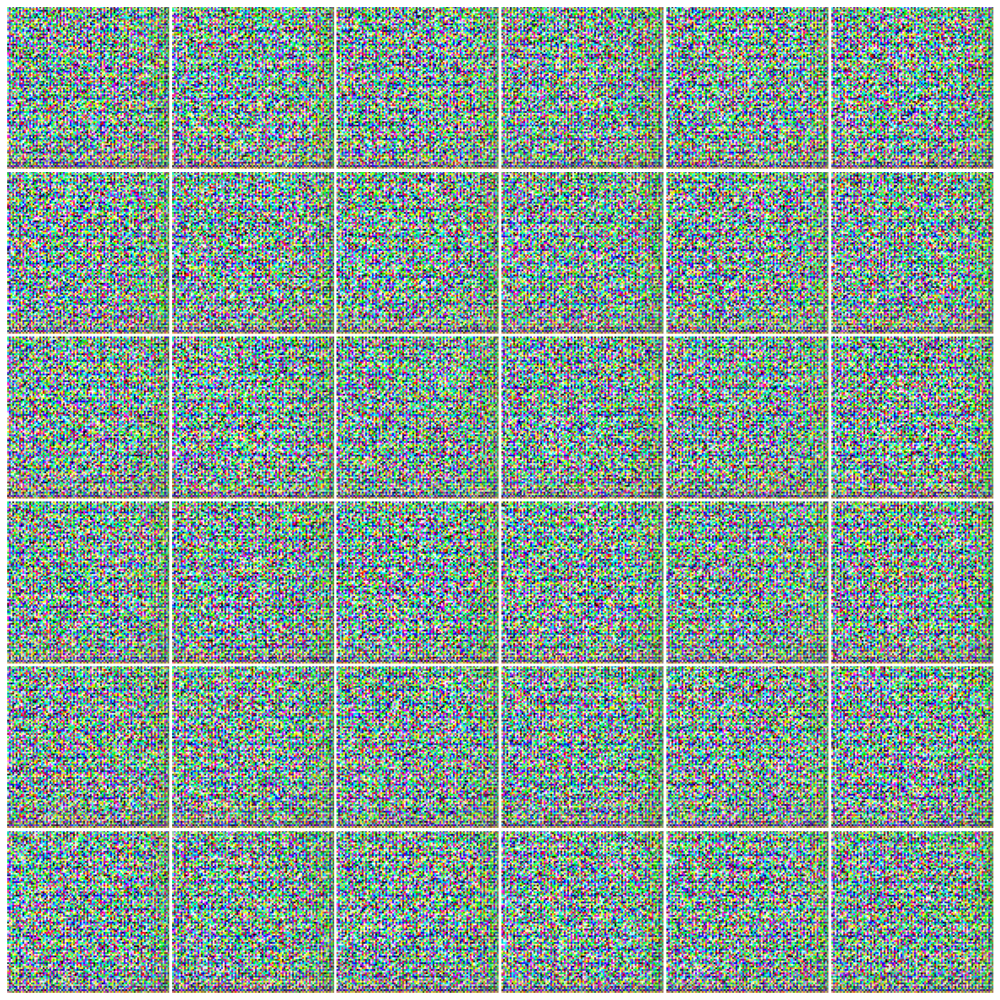

Epoch 10, Avg D Loss: 0.0000, Avg G Loss: 17.9338


Epoch 11/2000:   0%|          | 0/1032 [00:00<?, ?it/s]

Epoch 11, Avg D Loss: 0.0000, Avg G Loss: 18.4774


Epoch 12/2000:   0%|          | 0/1032 [00:00<?, ?it/s]

Epoch 12, Avg D Loss: 0.0000, Avg G Loss: 19.0173


Epoch 13/2000:   0%|          | 0/1032 [00:00<?, ?it/s]

Epoch 13, Avg D Loss: 0.0000, Avg G Loss: 19.5537


Epoch 14/2000:   0%|          | 0/1032 [00:00<?, ?it/s]

Epoch 14, Avg D Loss: 0.0000, Avg G Loss: 20.0894


Epoch 15/2000:   0%|          | 0/1032 [00:00<?, ?it/s]

Buffered data was truncated after reaching the output size limit.

In [17]:
gan_model, optimizerG, optimizerD, history = trainer(gan, train_dataloader, train_param, device=device)

Images after epoch 100:

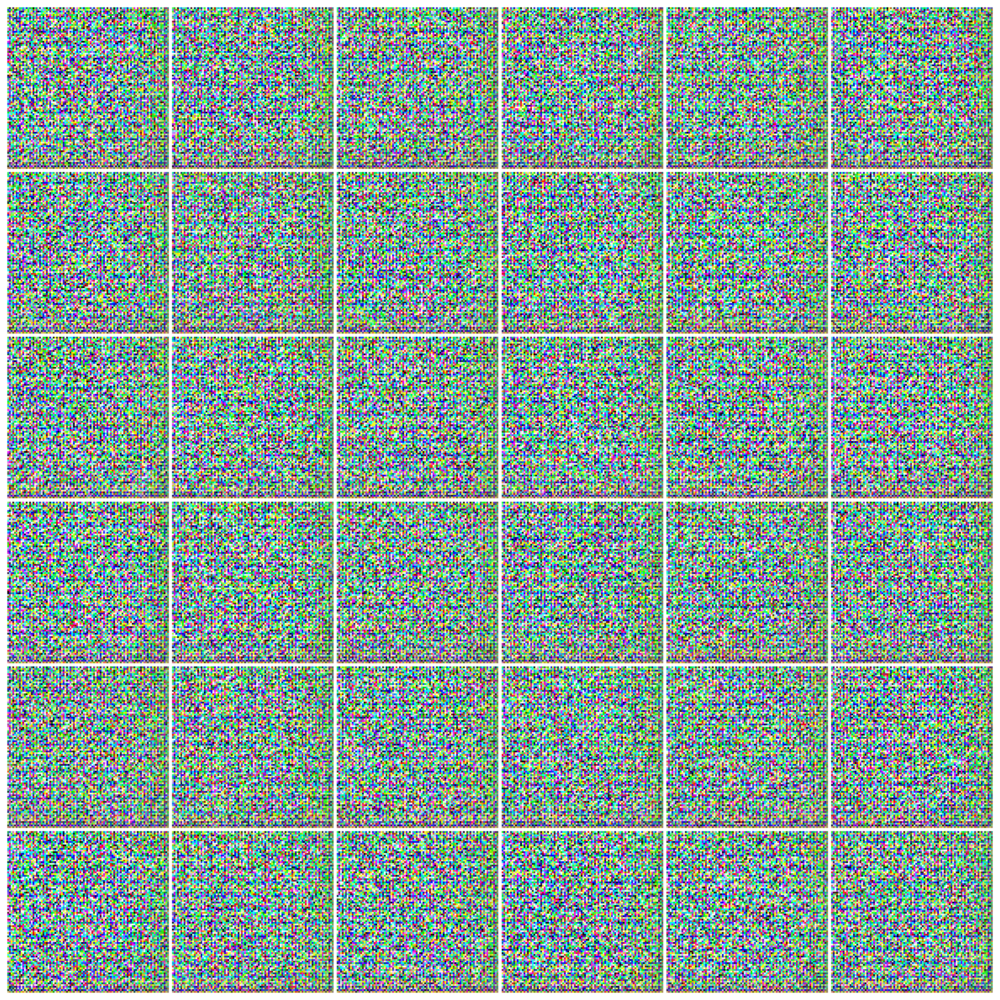

In [ ]:
def load_checkpoint(model, optimizerG, optimizerD, filename, device):
    """
    Load a GAN model checkpoint and continue training from there.

    :param model: an instance of your GAN model class (should have .generator and .discriminator attributes)
    :param optimizerG: the optimizer for the generator
    :param optimizerD: the optimizer for the discriminator
    :param filename: path to the checkpoint file
    :param device: the device to load the model onto (e.g., 'cuda' or 'cpu')
    :return: the model, optimizers, and the epoch number from which to continue training
    """
    # Load the checkpoint
    checkpoint = torch.load(filename, map_location=device)

    # Restore the models and optimizers
    model.generator.load_state_dict(checkpoint['generator_state_dict'])
    model.discriminator.load_state_dict(checkpoint['discriminator_state_dict'])
    optimizerG.load_state_dict(checkpoint['optimizerG_state_dict'])
    optimizerD.load_state_dict(checkpoint['optimizerD_state_dict'])

    # Return the epoch to continue from, model, and optimizers
    return checkpoint['epoch'], model, optimizerG, optimizerD

load_checkpoint(gan_model, optimizerG, optimizerD, 'gan_checkpoint.pth', device)

In [ ]:
def generate_latent_points_and_labels(latent_dim, n_samples, label, device='cpu'):
    """Generate latent points with the specified label for all samples"""
    z_input = torch.randn(n_samples, latent_dim, device=device)  # Random noise vector
    labels = torch.full((n_samples,), label, dtype=torch.long, device=device)  # Constant label
    return z_input, labels


def generate_images(generator, latent_dim, label, n_samples=10, device='cpu'):
    """Generate images for a specific label using the trained generator"""
    z_input, labels = generate_latent_points_and_labels(latent_dim, n_samples, label, device)
    with torch.no_grad():
        images = generator(z_input, labels)
    return images

def plot_generated_images(images, num_images=10):
    images = (images * 0.5 + 0.5)  # Undo normalization
    fig, axes = plt.subplots(1, num_images, figsize=(20, 2))
    for i, img in enumerate(images):
        ax = axes[i]
        img = img.cpu().detach().numpy().transpose(1, 2, 0)  # CHW to HWC
        ax.imshow(img)
        ax.axis('off')
    plt.show()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
generated_images = generate_images(gan_model.generator, latent_dim=100, label=1, n_samples=10, device=device)
print("Label 1 images")
plot_generated_images(generated_images, num_images=10)
generated_images = generate_images(gan_model.generator, latent_dim=100, label=0, n_samples=10, device=device)
print("Label 0 images")
plot_generated_images(generated_images, num_images=10)